In [ ]:
# ===============================
# 1. Install dependencies
# ===============================
#!pip install -q ultralytics transformers timm opencv-python matplotlib
!pip install -q transformers timm opencv-python matplotlib

In [2]:
from huggingface_hub import login
from google.colab import userdata
token = userdata.get('Nyi_token')
login(token=token)

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Hugging Face

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1OAwQPoxfnPPp90tlzRE1fTmfB377ksLA/Hugging Face


In [ ]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from transformers import pipeline
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# ===============================
# 2. Load models
# ===============================
depth_pipe = pipeline(task="depth-estimation", model="depth-anything/Depth-Anything-V2-Small-hf")
det_model = YOLO("yolov8n.pt")  # Replace with your weights if needed

In [ ]:
# ===============================
# 3. Helper functions
# ===============================
def project_points(points_3d, fx, fy, cx, cy):
    """Project 3D points into 2D image plane."""
    points_2d = []
    for X, Y, Z in points_3d:
        if Z <= 0:
            points_2d.append((None, None))
        else:
            x = int((X * fx) / Z + cx)
            y = int((Y * fy) / Z + cy)
            points_2d.append((x, y))
    return points_2d

def draw_cube(img, box_3d_2d, color=(0,255,0), thickness=2):
    """Draw cube given its projected 2D corner points."""
    # Top face
    for i in range(4):
        cv2.line(img, box_3d_2d[i], box_3d_2d[(i+1)%4], color, thickness, lineType=cv2.LINE_AA)
    # Bottom face
    for i in range(4, 8):
        cv2.line(img, box_3d_2d[i], box_3d_2d[4 + (i+1)%4], color, thickness, lineType=cv2.LINE_AA)
    # Vertical edges
    for i in range(4):
        cv2.line(img, box_3d_2d[i], box_3d_2d[i+4], color, thickness, lineType=cv2.LINE_AA)
    return img

In [ ]:
# ===============================
# 4. Load test image
# ===============================
import os
import requests

#img_path = "https://ultralytics.com/images/zidane.jpg"
img_path = "/content/gdrive/MyDrive/Pytorch-Models/datasets/pose-tests/pose (4).jpg"
# Download the image using requests
if img_path.startswith("http"):
    response = requests.get(img_path, stream=True)
    response.raise_for_status() # Raise an exception for bad status codes
    with open("downloaded_image.jpg", 'wb') as f:
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)
    img = cv2.imread("downloaded_image.jpg")
    os.remove("downloaded_image.jpg") # Clean up the downloaded file
else:
    img = cv2.imread(img_path)

if img is None:
    img = cv2.imread(os.path.basename(img_path)) # Try reading from the current directory if it's a local path

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
h, w = img_rgb.shape[:2]

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

In [ ]:
# ===============================
# 5. Depth estimation
# ===============================
depth_out = depth_pipe(img_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for YOLO bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)
print(depth_map)

# ===============================
# 6. YOLO detection
# ===============================
results = det_model(img_rgb)[0]

[[    0.11373     0.10196     0.10196 ...     0.15294     0.13725      0.1098]
 [    0.10588     0.10588     0.10588 ...     0.14902     0.14118     0.12941]
 [    0.10588     0.10588      0.1098 ...     0.14902     0.14902      0.1451]
 ...
 [    0.86667     0.86275     0.85882 ...      0.8549     0.85098     0.85098]
 [    0.86667     0.86667     0.86667 ...     0.86275     0.86275     0.86275]
 [     0.8549     0.86667     0.86667 ...     0.86275     0.87059     0.87451]]

0: 640x480 12 persons, 90.5ms
Speed: 14.1ms preprocess, 90.5ms inference, 416.0ms postprocess per image at shape (1, 3, 640, 480)


In [ ]:
def draw_slash_hatch_slanted(img, quad_pts, color=(0,255,255), spacing=10, thickness=1, direction=1, alpha=0.5):
    """
    Draw slash hatch lines inside a quad with optional transparency.
    """
    overlay = img.copy()  # temporary layer for transparency
    quad_pts = np.array(quad_pts, dtype=np.int32)
    x, y, w, h = cv2.boundingRect(quad_pts)

    # Determine diagonal vector for slash direction
    if direction == 1:
        dir_vec = np.array([1, -1], dtype=np.float32)  # /
    else:
        dir_vec = np.array([1, 1], dtype=np.float32)   # \

    dir_vec /= np.linalg.norm(dir_vec)  # normalize
    perp_vec = np.array([-dir_vec[1], dir_vec[0]], dtype=np.float32)

    num_lines = int((w + h) / spacing) + 2
    center = np.array([x + w/2, y + h/2])

    for i in range(-num_lines, num_lines):
        offset = perp_vec * (i * spacing)
        p1 = center + offset - dir_vec * max(w, h)
        p2 = center + offset + dir_vec * max(w, h)

        line_pts = np.linspace(p1, p2, 100)
        inside = [tuple(pt.astype(int)) for pt in line_pts if cv2.pointPolygonTest(quad_pts, pt, False) >= 0]
        if len(inside) >= 2:
            for a, b in zip(inside[:-1], inside[1:]):
                cv2.line(overlay, a, b, color, thickness, lineType=cv2.LINE_AA)

    # Blend overlay with original image
    cv2.addWeighted(overlay, alpha, img, 1 - alpha, 0, img)
    return img

Processing box (355, 672, 476, 927), depth_patch shape (255, 121)
Processing box (191, 343, 326, 620), depth_patch shape (277, 135)
Processing box (41, 658, 137, 928), depth_patch shape (270, 96)
Processing box (547, 25, 653, 297), depth_patch shape (272, 106)
Processing box (47, 25, 134, 295), depth_patch shape (270, 87)
Processing box (43, 343, 139, 626), depth_patch shape (283, 96)
Processing box (387, 348, 472, 622), depth_patch shape (274, 85)
Processing box (193, 29, 276, 290), depth_patch shape (261, 83)
Processing box (348, 26, 474, 301), depth_patch shape (275, 126)
Processing box (552, 341, 636, 622), depth_patch shape (281, 84)
Processing box (231, 659, 315, 928), depth_patch shape (269, 84)
Processing box (554, 654, 620, 929), depth_patch shape (275, 66)


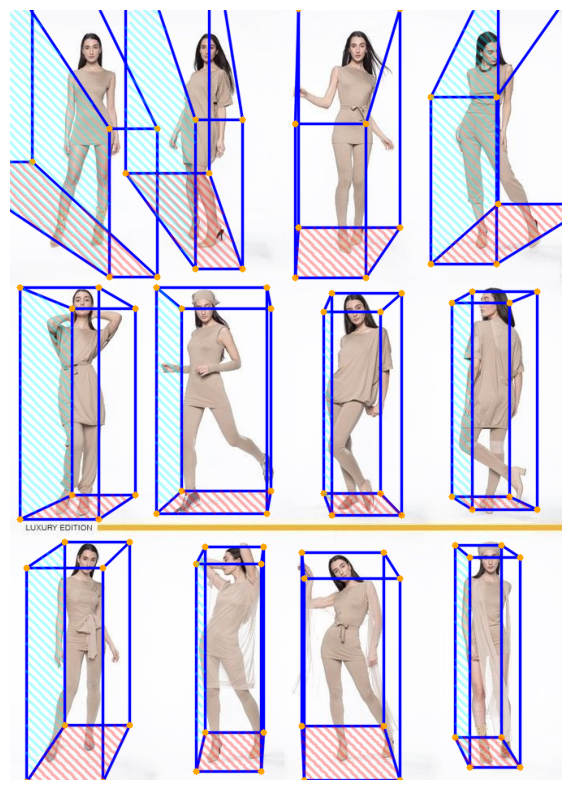

In [ ]:
# ===============================
# 7. Process each detection
# ===============================
output_img = img_rgb.copy()

for box in results.boxes.xyxy.cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    depth_patch = depth_map[y1:y2, x1:x2]

    if depth_patch.size == 0:
        print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
        continue

    # Debug prints (optional, remove if too verbose)
    print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

    # Depth at object center (median)
    obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

    # Width & height from bbox pixels -> meters
    box_width = (x2 - x1) / fx * obj_depth
    box_height = (y2 - y1) / fy * obj_depth

    # Depth from min/max inside bbox (depth variation)
    margin = 0.1  # adjust this based on depth scale

    mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
    if np.sum(mask) > 0:
        filtered_depths = depth_patch[mask]
        min_d = np.percentile(filtered_depths, 5)
        max_d = np.percentile(filtered_depths, 95)
        box_depth = max_d - min_d
        if box_depth < 1e-6:
            box_depth = box_width * 0.5
    else:
        box_depth = box_width * 0.5

    # After computing box_width, box_height, box_depth
    scale_xy = 0.9  # tweak as needed
    scale_z = 0.6 # tweak as needed

    box_width *= scale_xy
    box_height *= scale_xy
    box_depth *= scale_z

    # 3D cube corners (centered at bbox center)
    center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
    center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

    min_allowed_depth = 0.1  # meters

    corners_3d = []
    for dz in [-box_depth/2, box_depth/2]:
        for dy in [-box_height/2, box_height/2]:
            for dx in [-box_width/2, box_width/2]:
                Z = obj_depth + dz
                if Z < min_allowed_depth:
                    Z = min_allowed_depth
                corners_3d.append((center_x + dx, center_y + dy, Z))

    # Order corners: top 4, bottom 4
    ordered = [corners_3d[i] for i in [0,1,3,2,4,5,7,6]]

    # Project 3D points to 2D
    pts_2d = project_points(ordered, fx, fy, cx, cy)
    if any(p[0] is None for p in pts_2d):
        print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
        continue

    # Draw the cube
    output_img = draw_cube(output_img, pts_2d, color=(0, 0, 255), thickness=2)

    # Draw corner points (red dots)
    for (x, y) in pts_2d:
        if x is not None and y is not None:
            cv2.circle(output_img, (x, y), 4, (255, 165, 0), -1)

    top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
    bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
    side_face_pts = [pts_2d[i] for i in [0,4,7,3]]

    #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(255,0,0), spacing=8, thickness=2, direction=-1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=-1, alpha=0.3)

# ===============================
# 8. Show result
# ===============================
plt.figure(figsize=(10,10))
plt.imshow(output_img)
plt.axis("off")
plt.show()

In [4]:
import torch
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import pipeline
from transformers import (
    AutoProcessor,
    RTDetrForObjectDetection,
)

In [5]:
def project_points(points_3d, fx, fy, cx, cy):
    """Project 3D points into 2D image plane."""
    points_2d = []
    for X, Y, Z in points_3d:
        if Z <= 0:
            points_2d.append((None, None))
        else:
            x = int((X * fx) / Z + cx)
            y = int((Y * fy) / Z + cy)
            points_2d.append((x, y))
    return points_2d

def draw_cube(img, box_3d_2d, color=(0,255,0), thickness=2):
    """Draw cube given its projected 2D corner points."""
    # Top face
    for i in range(4):
        cv2.line(img, box_3d_2d[i], box_3d_2d[(i+1)%4], color, thickness, lineType=cv2.LINE_AA)
    # Bottom face
    for i in range(4, 8):
        cv2.line(img, box_3d_2d[i], box_3d_2d[4 + (i+1)%4], color, thickness, lineType=cv2.LINE_AA)
    # Vertical edges
    for i in range(4):
        cv2.line(img, box_3d_2d[i], box_3d_2d[i+4], color, thickness, lineType=cv2.LINE_AA)
    return img

def draw_slash_hatch_slanted(img, quad_pts, color=(0,255,255), spacing=10, thickness=1, direction=1, alpha=0.5):
    """
    Draw slash hatch lines inside a quad with optional transparency.
    """
    overlay = img.copy()  # temporary layer for transparency
    quad_pts = np.array(quad_pts, dtype=np.int32)
    x, y, w, h = cv2.boundingRect(quad_pts)

    # Determine diagonal vector for slash direction
    if direction == 1:
        dir_vec = np.array([1, -1], dtype=np.float32)  # /
    else:
        dir_vec = np.array([1, 1], dtype=np.float32)   # \

    dir_vec /= np.linalg.norm(dir_vec)  # normalize
    perp_vec = np.array([-dir_vec[1], dir_vec[0]], dtype=np.float32)

    num_lines = int((w + h) / spacing) + 2
    center = np.array([x + w/2, y + h/2])

    for i in range(-num_lines, num_lines):
        offset = perp_vec * (i * spacing)
        p1 = center + offset - dir_vec * max(w, h)
        p2 = center + offset + dir_vec * max(w, h)

        line_pts = np.linspace(p1, p2, 100)
        inside = [tuple(pt.astype(int)) for pt in line_pts if cv2.pointPolygonTest(quad_pts, pt, False) >= 0]
        if len(inside) >= 2:
            for a, b in zip(inside[:-1], inside[1:]):
                cv2.line(overlay, a, b, color, thickness, lineType=cv2.LINE_AA)

    # Blend overlay with original image
    cv2.addWeighted(overlay, alpha, img, 1 - alpha, 0, img)
    return img

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"

image_path = "datasets/excavators/Male-Posing.jpg"
image = Image.open(image_path).convert("RGB")

coco_image_processor = AutoProcessor.from_pretrained("PekingU/rtdetr_r50vd_coco_o365")
coco_model = RTDetrForObjectDetection.from_pretrained("PekingU/rtdetr_r50vd_coco_o365", device_map=device)

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.3
)
result = results[0]  # take first image results
print(result)

{'scores': tensor([0.9536, 0.9511, 0.9507, 0.9488, 0.9486, 0.9441, 0.9427, 0.9422, 0.9396],
       device='cuda:0'), 'labels': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0'), 'boxes': tensor([[246.2718, 368.7475, 363.8955, 667.3515],
        [446.7241, 369.6373, 557.8123, 669.6661],
        [255.3428,  38.0582, 344.9280, 333.4521],
        [ 53.1028, 368.7918, 154.8116, 665.1823],
        [455.0810,  38.2460, 537.5444, 335.8153],
        [ 67.6917,  37.1542, 156.3227, 332.8401],
        [457.8553, 704.4690, 534.8478, 993.8627],
        [268.9287, 703.4868, 345.5343, 996.0200],
        [ 72.6325, 701.0164, 162.9306, 992.3115]], device='cuda:0')}


In [ ]:
h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

In [ ]:
depth_pipe = pipeline(task="depth-estimation", model="depth-anything/Depth-Anything-V2-Small-hf")

In [ ]:
depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for YOLO bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)
print(depth_map)

[[0.53333336 0.52156866 0.52156866 ... 0.4509804  0.43529412 0.3764706 ]
 [0.5176471  0.5137255  0.5176471  ... 0.44705883 0.4392157  0.41960785]
 [0.52156866 0.52156866 0.5254902  ... 0.4509804  0.44705883 0.44705883]
 ...
 [0.92941177 0.92941177 0.92941177 ... 0.9019608  0.8980392  0.8980392 ]
 [0.93333334 0.93333334 0.93333334 ... 0.90588236 0.90588236 0.90588236]
 [0.91764706 0.93333334 0.92941177 ... 0.9019608  0.9098039  0.9137255 ]]


Processing box (246, 368, 363, 667), depth_patch shape (299, 117)
Processing box (446, 369, 557, 669), depth_patch shape (300, 111)
Processing box (255, 38, 344, 333), depth_patch shape (295, 89)
Processing box (53, 368, 154, 665), depth_patch shape (297, 101)
Processing box (455, 38, 537, 335), depth_patch shape (297, 82)
Processing box (67, 37, 156, 332), depth_patch shape (295, 89)
Processing box (457, 704, 534, 993), depth_patch shape (289, 77)
Processing box (268, 703, 345, 996), depth_patch shape (293, 77)
Processing box (72, 701, 162, 992), depth_patch shape (291, 90)


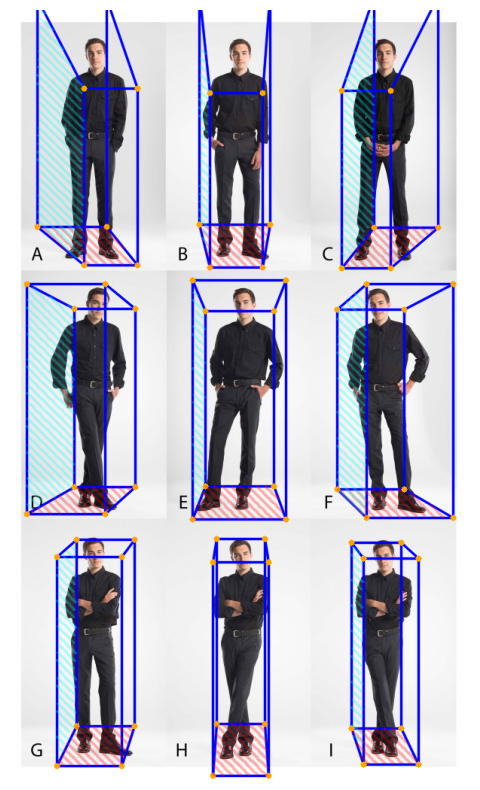

In [ ]:
output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)

for box in result['boxes'].cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    depth_patch = depth_map[y1:y2, x1:x2]

    if depth_patch.size == 0:
        print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
        continue

    # Debug prints (optional, remove if too verbose)
    print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

    # Depth at object center (median)
    obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

    # Width & height from bbox pixels -> meters
    box_width = (x2 - x1) / fx * obj_depth
    box_height = (y2 - y1) / fy * obj_depth

    # Depth from min/max inside bbox (depth variation)
    margin = 0.1  # adjust this based on depth scale

    mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
    if np.sum(mask) > 0:
        filtered_depths = depth_patch[mask]
        min_d = np.percentile(filtered_depths, 5)
        max_d = np.percentile(filtered_depths, 95)
        box_depth = max_d - min_d
        if box_depth < 1e-6:
            box_depth = box_width * 0.5
    else:
        box_depth = box_width * 0.5

    # After computing box_width, box_height, box_depth
    scale_xy = 0.9  # tweak as needed
    scale_z = 0.6 # tweak as needed

    box_width *= scale_xy
    box_height *= scale_xy
    box_depth *= scale_z

    # 3D cube corners (centered at bbox center)
    center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
    center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

    min_allowed_depth = 0.1  # meters

    corners_3d = []
    for dz in [-box_depth/2, box_depth/2]:
        for dy in [-box_height/2, box_height/2]:
            for dx in [-box_width/2, box_width/2]:
                Z = obj_depth + dz
                if Z < min_allowed_depth:
                    Z = min_allowed_depth
                corners_3d.append((center_x + dx, center_y + dy, Z))

    # Order corners: top 4, bottom 4
    ordered = [corners_3d[i] for i in [0,1,3,2,4,5,7,6]]

    # Project 3D points to 2D
    pts_2d = project_points(ordered, fx, fy, cx, cy)
    if any(p[0] is None for p in pts_2d):
        print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
        continue

    # Draw the cube
    output_img = draw_cube(output_img, pts_2d, color=(255, 0, 0), thickness=2)

    # Draw corner points (red dots)
    for (x, y) in pts_2d:
        if x is not None and y is not None:
            cv2.circle(output_img, (x, y), 4, (0, 165, 255), -1)

    top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
    bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
    side_face_pts = [pts_2d[i] for i in [0,4,7,3]]

    #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(0,0,255), spacing=8, thickness=2, direction=-1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(255,255,0), spacing=8, thickness=2, direction=-1, alpha=0.3)

# ===============================
# 8. Show result
# ===============================
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)) # Convert back to RGB for displaying with matplotlib
plt.axis("off")
plt.show()

In [7]:
device = "cuda" if torch.cuda.is_available() else "cpu"

coco_image_processor = AutoProcessor.from_pretrained("PekingU/rtdetr_r50vd_coco_o365")
coco_model = RTDetrForObjectDetection.from_pretrained("PekingU/rtdetr_r50vd_coco_o365", device_map=device)

depth_pipe = pipeline(task="depth-estimation", model="depth-anything/Depth-Anything-V2-Small-hf")

Device set to use cuda:0


Processing box (178, 72, 424, 342), depth_patch shape (270, 246)


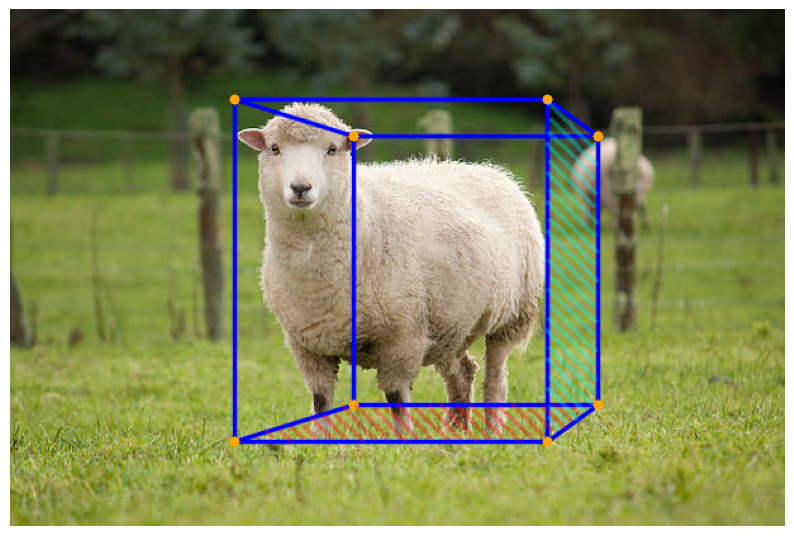

In [ ]:
image_path = "datasets/vitpose_models/sheep.jpg"
image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.9
)
result = results[0]  # take first image results

h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for YOLO bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)

for box in result['boxes'].cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    depth_patch = depth_map[y1:y2, x1:x2]

    if depth_patch.size == 0:
        print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
        continue

    # Debug prints (optional, remove if too verbose)
    print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

    # Depth at object center (median)
    obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

    # Width & height from bbox pixels -> meters
    box_width = (x2 - x1) / fx * obj_depth
    box_height = (y2 - y1) / fy * obj_depth

    # Depth from min/max inside bbox (depth variation)
    margin = 0.1  # adjust this based on depth scale

    mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
    if np.sum(mask) > 0:
        filtered_depths = depth_patch[mask]
        min_d = np.percentile(filtered_depths, 5)
        max_d = np.percentile(filtered_depths, 95)
        box_depth = max_d - min_d
        if box_depth < 1e-6:
            box_depth = box_width * 0.5
    else:
        box_depth = box_width * 0.5

    # After computing box_width, box_height, box_depth
    scale_xy = 1  # tweak as needed
    scale_z = 1 # tweak as needed

    box_width *= scale_xy
    box_height *= scale_xy
    box_depth *= scale_z

    # 3D cube corners (centered at bbox center)
    center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
    center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

    min_allowed_depth = 0.1  # meters

    corners_3d = []
    # for dz in [-box_depth/2, box_depth/2]:
    #     for dy in [-box_height/2, box_height/2]:
    #         for dx in [-box_width/2, box_width/2]:
    #             Z = obj_depth + dz
    #             if Z < min_allowed_depth:
    #                 Z = min_allowed_depth
    #             corners_3d.append((center_x + dx, center_y + dy, Z))

    # --- front pixel corners (TL, TR, BR, BL) ---
    u_f = np.array([x1, x2, x2, x1], dtype=np.float32)
    v_f = np.array([y1, y1, y2, y2], dtype=np.float32)
    Zf = float(obj_depth)

    # Convert front pixel corners -> camera coords
    Xf = ((u_f - cx) / fx) * Zf
    Yf = ((v_f - cy) / fy) * Zf
    front_corners = [(float(Xf[i]), float(Yf[i]), Zf) for i in range(4)]

    # --- back face: shift in 3D space, not in pixel space ---
    # Move along +X and +Z for perspective depth
    back_shift_x = box_depth * 0.5    # how much to move right
    back_shift_z = box_depth          # how much to move back

    Xb = Xf + back_shift_x
    Yb = Yf.copy()
    Zb = Zf + back_shift_z
    back_corners = [(float(Xb[i]), float(Yb[i]), float(Zb)) for i in range(4)]

    # --- assemble and order corners ---
    corners_3d = front_corners + back_corners

    # Order corners: top 4, bottom 4
    ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

    # Project 3D points to 2D
    pts_2d = project_points(ordered, fx, fy, cx, cy)
    if any(p[0] is None for p in pts_2d):
        print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
        continue

    # Draw the cube
    output_img = draw_cube(output_img, pts_2d, color=(255, 0, 0), thickness=2)

    # Draw corner points (red dots)
    for (x, y) in pts_2d:
        if x is not None and y is not None:
            cv2.circle(output_img, (x, y), 4, (0, 165, 255), -1)

    top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
    bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
    side_face_pts = [pts_2d[i] for i in [5,1,2,6]]

    #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(0,0,255), spacing=8, thickness=2, direction=-1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(255,255,0), spacing=8, thickness=2, direction=-1, alpha=0.3)

# ===============================
# 8. Show result
# ===============================
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)) # Convert back to RGB for displaying with matplotlib
plt.axis("off")
plt.show()

In [8]:
def depth_to_heatmap(depth_map_norm, colormap=cv2.COLORMAP_JET):
    """
    Convert a normalized depth map (0-1 float) to a colorful heatmap image (BGR uint8).

    Args:
        depth_map_norm (np.ndarray): Normalized depth map with values in [0, 1].
        colormap (int): OpenCV colormap type. Default is COLORMAP_JET.

    Returns:
        heatmap_bgr (np.ndarray): Color heatmap image in BGR uint8 format.
    """
    # Clip and scale depth to 0-255 uint8
    depth_uint8 = np.clip(depth_map_norm * 255, 0, 255).astype(np.uint8)

    # Apply colormap (e.g., JET)
    heatmap = cv2.applyColorMap(depth_uint8, colormap)

    return heatmap

Processing box (199, 53, 806, 578), depth_patch shape (525, 607)


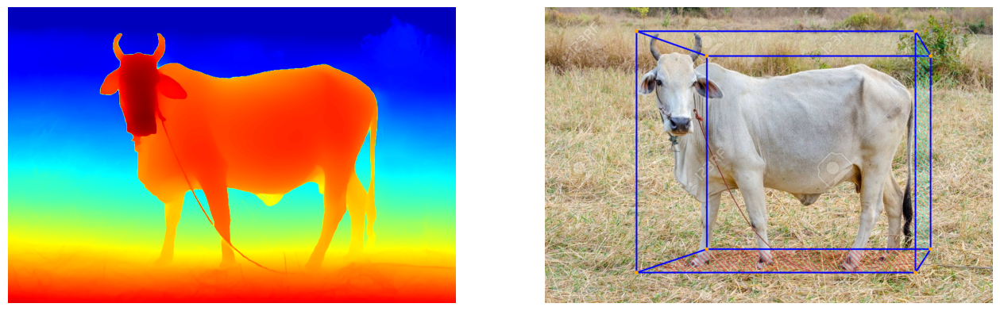

In [ ]:
image_path = "datasets/vitpose_models/cow.jpg"
image = Image.open(image_path).convert("RGB")

inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

with torch.no_grad():
    outputs = coco_model(**inputs)

results = coco_image_processor.post_process_object_detection(
    outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.9
)
result = results[0]  # take first image results

h, w = image.height, image.width

# Camera intrinsics (simple guess)
fx = fy = w
cx, cy = w // 2, h // 2

depth_out = depth_pipe(image_path)
depth_map = np.array(depth_out["depth"], dtype=np.float32)
depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

# Resize to match original image size for YOLO bbox indexing
depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

output_img = image.copy()
output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)

img_depth = depth_to_heatmap(depth_map, colormap=cv2.COLORMAP_JET)

for box in result['boxes'].cpu().numpy():
    # Clamp and convert bbox coords
    x1 = max(0, min(w - 1, int(box[0])))
    y1 = max(0, min(h - 1, int(box[1])))
    x2 = max(0, min(w, int(box[2])))
    y2 = max(0, min(h, int(box[3])))

    # Skip invalid boxes
    if x2 <= x1 or y2 <= y1:
        print(f"Skipping invalid box {(x1, y1, x2, y2)}")
        continue

    depth_patch = depth_map[y1:y2, x1:x2]

    if depth_patch.size == 0:
        print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
        continue

    # Debug prints (optional, remove if too verbose)
    print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

    # Depth at object center (median)
    obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

    # Width & height from bbox pixels -> meters
    box_width = (x2 - x1) / fx * obj_depth
    box_height = (y2 - y1) / fy * obj_depth

    # Depth from min/max inside bbox (depth variation)
    margin = 0.1  # adjust this based on depth scale

    mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
    if np.sum(mask) > 0:
        filtered_depths = depth_patch[mask]
        min_d = np.percentile(filtered_depths, 5)
        max_d = np.percentile(filtered_depths, 95)
        box_depth = max_d - min_d
        if box_depth < 1e-6:
            box_depth = box_width * 0.5
    else:
        box_depth = box_width * 0.5

    # After computing box_width, box_height, box_depth
    scale_xy = 1  # tweak as needed
    scale_z = 1 # tweak as needed

    box_width *= scale_xy
    box_height *= scale_xy
    box_depth *= scale_z

    # 3D cube corners (centered at bbox center)
    center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
    center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

    min_allowed_depth = 0.1  # meters

    corners_3d = []
    # for dz in [-box_depth/2, box_depth/2]:
    #     for dy in [-box_height/2, box_height/2]:
    #         for dx in [-box_width/2, box_width/2]:
    #             Z = obj_depth + dz
    #             if Z < min_allowed_depth:
    #                 Z = min_allowed_depth
    #             corners_3d.append((center_x + dx, center_y + dy, Z))

    # --- front pixel corners (TL, TR, BR, BL) ---
    u_f = np.array([x1, x2, x2, x1], dtype=np.float32)
    v_f = np.array([y1, y1, y2, y2], dtype=np.float32)
    Zf = float(obj_depth)

    # Convert front pixel corners -> camera coords
    Xf = ((u_f - cx) / fx) * Zf
    Yf = ((v_f - cy) / fy) * Zf
    front_corners = [(float(Xf[i]), float(Yf[i]), Zf) for i in range(4)]

    # --- back face: shift in 3D space, not in pixel space ---
    # Move along +X and +Z for perspective depth
    back_shift_x = box_depth * 0.5    # how much to move right
    back_shift_z = box_depth          # how much to move back

    Xb = Xf + back_shift_x
    Yb = Yf.copy()
    Zb = Zf + back_shift_z
    back_corners = [(float(Xb[i]), float(Yb[i]), float(Zb)) for i in range(4)]

    # --- assemble and order corners ---
    corners_3d = front_corners + back_corners

    # Order corners: top 4, bottom 4
    ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

    # Project 3D points to 2D
    pts_2d = project_points(ordered, fx, fy, cx, cy)
    if any(p[0] is None for p in pts_2d):
        print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
        continue

    # Draw the cube
    output_img = draw_cube(output_img, pts_2d, color=(255, 0, 0), thickness=2)

    # Draw corner points (red dots)
    for (x, y) in pts_2d:
        if x is not None and y is not None:
            cv2.circle(output_img, (x, y), 4, (0, 165, 255), -1)

    top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
    bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
    side_face_pts = [pts_2d[i] for i in [5,1,2,6]]

    #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(0,0,255), spacing=8, thickness=2, direction=-1, alpha=0.3)
    output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(255,255,0), spacing=8, thickness=2, direction=-1, alpha=0.3)

    # Convert to RGB for matplotlib
    img_depth = cv2.cvtColor(img_depth, cv2.COLOR_BGR2RGB)
    output_img = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)

# Plot side-by-side
plt.figure(figsize=(16, 16))
plt.subplot(1, 2, 1)
plt.axis('off')
plt.imshow(img_depth)

plt.subplot(1, 2, 2)
plt.axis('off')
plt.imshow(output_img)

plt.show()

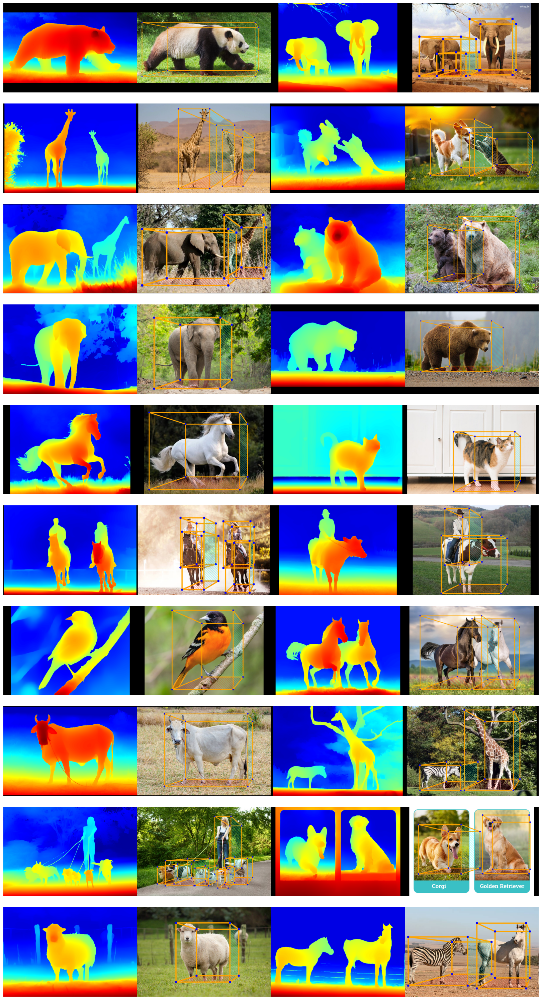

In [ ]:
val_dir = "datasets/vitpose_models"
num_samples = 20

all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image = Image.open(image_path).convert("RGB")

    inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = coco_model(**inputs)

    results = coco_image_processor.post_process_object_detection(
        outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.9
    )
    result = results[0]  # take first image results

    h, w = image.height, image.width

    # Camera intrinsics (simple guess)
    fx = fy = w
    cx, cy = w // 2, h // 2

    depth_out = depth_pipe(image_path)
    depth_map = np.array(depth_out["depth"], dtype=np.float32)
    depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

    # Resize to match original image size for YOLO bbox indexing
    depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

    output_img = image.copy()
    output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)

    img_depth = depth_to_heatmap(depth_map, colormap=cv2.COLORMAP_JET)

    for box in result['boxes'].cpu().numpy():
        # Clamp and convert bbox coords
        x1 = max(0, min(w - 1, int(box[0])))
        y1 = max(0, min(h - 1, int(box[1])))
        x2 = max(0, min(w, int(box[2])))
        y2 = max(0, min(h, int(box[3])))

        # Skip invalid boxes
        if x2 <= x1 or y2 <= y1:
            print(f"Skipping invalid box {(x1, y1, x2, y2)}")
            continue

        depth_patch = depth_map[y1:y2, x1:x2]

        if depth_patch.size == 0:
            print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
            continue

        # Debug prints (optional, remove if too verbose)
        #print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

        # Depth at object center (median)
        obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

        # Width & height from bbox pixels -> meters
        box_width = (x2 - x1) / fx * obj_depth
        box_height = (y2 - y1) / fy * obj_depth

        # Depth from min/max inside bbox (depth variation)
        margin = 0.1  # adjust this based on depth scale

        mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
        if np.sum(mask) > 0:
            filtered_depths = depth_patch[mask]
            min_d = np.percentile(filtered_depths, 5)
            max_d = np.percentile(filtered_depths, 95)
            box_depth = max_d - min_d
            if box_depth < 1e-6:
                box_depth = box_width * 0.5
        else:
            box_depth = box_width * 0.5

        # After computing box_width, box_height, box_depth
        scale_xy = 1  # tweak as needed
        scale_z = 1 # tweak as needed

        box_width *= scale_xy
        box_height *= scale_xy
        box_depth *= scale_z

        # 3D cube corners (centered at bbox center)
        center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
        center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

        min_allowed_depth = 0.1  # meters

        corners_3d = []

        # --- front pixel corners (TL, TR, BR, BL) ---
        u_f = np.array([x1, x2, x2, x1], dtype=np.float32)
        v_f = np.array([y1, y1, y2, y2], dtype=np.float32)
        Zf = float(obj_depth)

        # Convert front pixel corners -> camera coords
        Xf = ((u_f - cx) / fx) * Zf
        Yf = ((v_f - cy) / fy) * Zf
        front_corners = [(float(Xf[i]), float(Yf[i]), Zf) for i in range(4)]

        # --- back face: shift in 3D space, not in pixel space ---
        # Move along +X and +Z for perspective depth
        back_shift_x = box_depth * 0.5    # how much to move right
        back_shift_z = box_depth          # how much to move back

        Xb = Xf + back_shift_x
        Yb = Yf.copy()
        Zb = Zf + back_shift_z
        back_corners = [(float(Xb[i]), float(Yb[i]), float(Zb)) for i in range(4)]

        # --- assemble and order corners ---
        corners_3d = front_corners + back_corners

        # Order corners: top 4, bottom 4
        ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

        # Project 3D points to 2D
        pts_2d = project_points(ordered, fx, fy, cx, cy)
        if any(p[0] is None for p in pts_2d):
            print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
            continue

        # Draw the cube
        output_img = draw_cube(output_img, pts_2d, color=(0, 165, 255), thickness=4)

        # Draw corner points (red dots)
        for (x, y) in pts_2d:
            if x is not None and y is not None:
                cv2.circle(output_img, (x, y), 5, (255, 0, 0), -1)

        top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
        bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
        side_face_pts = [pts_2d[i] for i in [5,1,2,6]]

        #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
        output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(0,0,255), spacing=8, thickness=2, direction=-1, alpha=0.3)
        output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(255,255,0), spacing=8, thickness=2, direction=-1, alpha=0.3)

    # Convert to RGB for matplotlib
    img_depth = cv2.cvtColor(img_depth, cv2.COLOR_BGR2RGB)
    output_img = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)

    processed_imgs.append((img_depth, output_img))
    img_sizes.append(output_img.shape[:2])  # (height, width)

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()

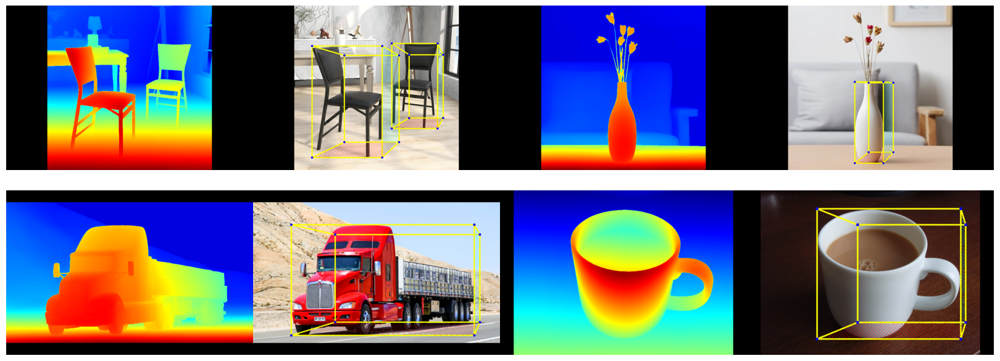

In [14]:
val_dir = "datasets/3d_test"
num_samples = 4

all_imgs = [f for f in os.listdir(val_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
selected_imgs = random.sample(all_imgs, min(num_samples, len(all_imgs)))
img_paths = [os.path.join(val_dir, fname) for fname in selected_imgs]

processed_imgs = []
img_sizes = []

for image_path in img_paths:
    # Load image
    image = Image.open(image_path).convert("RGB")

    inputs = coco_image_processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = coco_model(**inputs)

    results = coco_image_processor.post_process_object_detection(
        outputs, target_sizes=torch.tensor([(image.height, image.width)]), threshold=0.9
    )
    result = results[0]  # take first image results

    h, w = image.height, image.width

    # Camera intrinsics (simple guess)
    fx = fy = w
    cx, cy = w // 2, h // 2

    depth_out = depth_pipe(image_path)
    depth_map = np.array(depth_out["depth"], dtype=np.float32)
    depth_map = depth_map / np.max(depth_map)  # Normalize to 0-1

    # Resize to match original image size for YOLO bbox indexing
    depth_map = cv2.resize(depth_map, (w, h), interpolation=cv2.INTER_LINEAR)

    output_img = image.copy()
    output_img = cv2.cvtColor(np.array(output_img), cv2.COLOR_RGB2BGR)

    img_depth = depth_to_heatmap(depth_map, colormap=cv2.COLORMAP_JET)

    for box in result['boxes'].cpu().numpy():
        # Clamp and convert bbox coords
        x1 = max(0, min(w - 1, int(box[0])))
        y1 = max(0, min(h - 1, int(box[1])))
        x2 = max(0, min(w, int(box[2])))
        y2 = max(0, min(h, int(box[3])))

        # Skip invalid boxes
        if x2 <= x1 or y2 <= y1:
            print(f"Skipping invalid box {(x1, y1, x2, y2)}")
            continue

        depth_patch = depth_map[y1:y2, x1:x2]

        if depth_patch.size == 0:
            print(f"Empty depth patch for box {(x1, y1, x2, y2)}")
            continue

        # Debug prints (optional, remove if too verbose)
        #print(f"Processing box {(x1, y1, x2, y2)}, depth_patch shape {depth_patch.shape}")

        # Depth at object center (median)
        obj_depth = np.median(depth_patch) + 1e-6  # avoid div by zero

        # Width & height from bbox pixels -> meters
        box_width = (x2 - x1) / fx * obj_depth
        box_height = (y2 - y1) / fy * obj_depth

        # Depth from min/max inside bbox (depth variation)
        margin = 0.1  # adjust this based on depth scale

        mask = (depth_patch > obj_depth - margin) & (depth_patch < obj_depth + margin)
        if np.sum(mask) > 0:
            filtered_depths = depth_patch[mask]
            min_d = np.percentile(filtered_depths, 5)
            max_d = np.percentile(filtered_depths, 95)
            box_depth = max_d - min_d
            if box_depth < 1e-6:
                box_depth = box_width * 0.5
        else:
            box_depth = box_width * 0.5

        # After computing box_width, box_height, box_depth
        scale_xy = 1  # tweak as needed
        scale_z = 1 # tweak as needed

        box_width *= scale_xy
        box_height *= scale_xy
        box_depth *= scale_z

        # 3D cube corners (centered at bbox center)
        center_x = ((x1 + x2) / 2 - cx) / fx * obj_depth
        center_y = ((y1 + y2) / 2 - cy) / fy * obj_depth

        min_allowed_depth = 0.1  # meters

        corners_3d = []

        # --- front pixel corners (TL, TR, BR, BL) ---
        u_f = np.array([x1, x2, x2, x1], dtype=np.float32)
        v_f = np.array([y1, y1, y2, y2], dtype=np.float32)
        Zf = float(obj_depth)

        # Convert front pixel corners -> camera coords
        Xf = ((u_f - cx) / fx) * Zf
        Yf = ((v_f - cy) / fy) * Zf
        front_corners = [(float(Xf[i]), float(Yf[i]), Zf) for i in range(4)]

        # --- back face: shift in 3D space, not in pixel space ---
        # Move along +X and +Z for perspective depth
        back_shift_x = box_depth * 0.5    # how much to move right
        back_shift_z = box_depth          # how much to move back

        Xb = Xf + back_shift_x
        Yb = Yf.copy()
        Zb = Zf + back_shift_z
        back_corners = [(float(Xb[i]), float(Yb[i]), float(Zb)) for i in range(4)]

        # --- assemble and order corners ---
        corners_3d = front_corners + back_corners

        # Order corners: top 4, bottom 4
        ordered = [corners_3d[i] for i in [0,1,2,3,4,5,6,7]]

        # Project 3D points to 2D
        pts_2d = project_points(ordered, fx, fy, cx, cy)
        if any(p[0] is None for p in pts_2d):
            print(f"Skipping box due to invalid projection points for box {(x1, y1, x2, y2)}")
            continue

        # Draw the cube
        output_img = draw_cube(output_img, pts_2d, color=(0, 255, 255), thickness=4)

        # Draw corner points (red dots)
        for (x, y) in pts_2d:
            if x is not None and y is not None:
                cv2.circle(output_img, (x, y), 5, (255, 0, 0), -1)

        top_face_pts = [pts_2d[i] for i in [0,4,5,1]]
        bottom_face_pts = [pts_2d[i] for i in [2,6,7,3]]
        side_face_pts = [pts_2d[i] for i in [5,1,2,6]]

        #output_img = draw_slash_hatch_slanted(output_img, top_face_pts, color=(0,255,255), spacing=8, thickness=2, direction=1, alpha=0.3)
        output_img = draw_slash_hatch_slanted(output_img, bottom_face_pts, color=(0,0,255), spacing=8, thickness=2, direction=-1, alpha=0.3)
        output_img = draw_slash_hatch_slanted(output_img, side_face_pts, color=(255,255,0), spacing=8, thickness=2, direction=-1, alpha=0.3)

    # Convert to RGB for matplotlib
    img_depth = cv2.cvtColor(img_depth, cv2.COLOR_BGR2RGB)
    output_img = cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB)

    processed_imgs.append((img_depth, output_img))
    img_sizes.append(output_img.shape[:2])  # (height, width)

cols = 4  # 2 images x 2 visuals = 4 subplots per row
rows = (len(processed_imgs) + 1) // 2  # 2 images per row

plt.figure(figsize=(4 * cols, 3 * rows))

# Target display size for each grid cell
target_height = 720
target_width = 1080

for idx, (img1, img2) in enumerate(processed_imgs):
    for view_idx, view in enumerate([img1, img2]):
        h, w = view.shape[:2]

        # Scale keeping aspect ratio
        scale = min(target_width / w, target_height / h)
        new_w, new_h = int(w * scale), int(h * scale)
        resized = cv2.resize(view, (new_w, new_h), interpolation=cv2.INTER_LINEAR)

        # Pad to target size
        top = (target_height - new_h) // 2
        bottom = target_height - new_h - top
        left = (target_width - new_w) // 2
        right = target_width - new_w - left
        padded = cv2.copyMakeBorder(resized, top, bottom, left, right,
                                    borderType=cv2.BORDER_CONSTANT, value=(0, 0, 0))

        plot_idx = idx * 2 + view_idx + 1
        plt.subplot(rows, cols, plot_idx)
        plt.imshow(padded)
        plt.axis('off')

plt.tight_layout(pad=0)           # removes padding around the whole figure
plt.subplots_adjust(wspace=0, hspace=0)  # removes spacing between cells
plt.show()